# Imports for Classification Model

In [1]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Read in the Dataframe.csv file

In [3]:
# load in the csv file to a variable named df
df = pd.read_csv('dataframe.csv').drop(columns='Unnamed: 0')

df.head()

,Name,Type,Level,Rarity,Damage,Health,Energy,Sanity,Timestamp
0,Revenant,Undead,14,Rank 0,14d2+4,28.64,28.06,27.11,2024-04-25 16:29:34
1,Flame Devil,Devilkin,5,Rank 3,5d8+1,36.05,43.73,39.58,2024-04-25 16:29:34
2,Faerie Dragon,Dragon,6,Rank 2,6d6,37.16,35.18,37.64,2024-04-25 16:29:34
3,Gold Archfey,Fey,9,Rank 2,9d6+3,52.38,55.91,53.18,2024-04-25 16:29:34
4,Dust Elemental,Elemental,13,Rank 1,13d4,51.41,51.96,53.69,2024-04-25 16:29:34


# Create my Features and Target Vectors

In [4]:
# split data from large and normal df in target and independent variables
target = 'Rarity'
columns_to_drop = ['Name', 'Type', 'Damage', 'Rarity', 'Timestamp']

X = df.drop(columns=columns_to_drop)
y = df[target]

In [5]:
# test to make sure data is correct
X.shape[0] == df.shape[0] and y.shape[0] == df.shape[0]

True

In [6]:
# split the train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [7]:
# test shape is still the same
assert X_train.shape[0] + X_test.shape[0] == X.shape[0]

# Random Forest Classifier

In [284]:
# instantiate a RandomForestClassifier with X_train, y_train
model_rf = RandomForestClassifier()

# fit the instantiated model
model_rf.fit(X_train, y_train)

RandomForestClassifier()

In [308]:
# check both the training and test sets accuracy score
y_train_pred = model_rf.predict(X_train)
y_test_pred = model_rf.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Training Accuracy (with X_train): {train_accuracy}")
print(f"Test Accuracy (with X_test): {test_accuracy}")

Training Accuracy (with X_train): 1.0
Test Accuracy (with X_test): 0.935


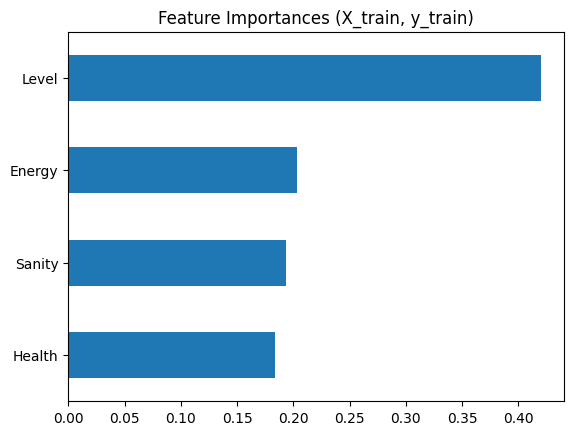

In [309]:
# plot the feature importances with X_train, y_train
importances = model_rf.feature_importances_
feature_names = X_train.columns

pd.Series(importances, index= feature_names).sort_values(ascending=True).plot(kind='barh', title= "Feature Importances (X_train, y_train)");

In [310]:
# create an estimator for the GridSearchCV
estimator = RandomForestClassifier(
    n_jobs=-1,
    random_state=42
)

In [311]:
# create a param_grid to find the best hyperparameters
param_grid = {
    'n_estimators': [10, 20, 30, 40, 50, 100, 200, 300],
    'max_depth': [None, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'max_features': [1, 2, 3, 4]
}

grid_search = GridSearchCV(estimator,
                           param_grid,
                           cv= 5,
                           scoring='accuracy',
                           n_jobs=-1,
                           verbose=1
                           )

grid_search.fit(X_train, y_train)
print(f"Best Score: {grid_search.best_score_}")
print(f"Best Params: {grid_search.best_params_}")

Fitting 5 folds for each of 352 candidates, totalling 1760 fits


/Users/hunterpeterson/.local/share/virtualenvs/BandersnatchStarter-FLjjOeY4/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/hunterpeterson/.local/share/virtualenvs/BandersnatchStarter-FLjjOeY4/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/hunterpeterson/.local/share/virtualenvs/Bandersna

Best Score: 0.9216666666666666
Best Params: {'max_depth': None, 'max_features': 3, 'n_estimators': 200}


In [26]:
# instantiate a RandomForestClassifier() with best params from GridSearchCV
best_params = RandomForestClassifier(
    max_features=3,
    n_estimators=200
)

#fit the model
best_params.fit(X_train, y_train)

# get the accuracy for train and test
train_acc_pred = best_params.predict(X_train)
test_acc_pred = best_params.predict(X_test)

train_acc = accuracy_score(y_train, train_acc_pred)
test_acc = accuracy_score(y_test, test_acc_pred)


print(f"Training Accuracy (LARGE DATASET): {train_acc}")
print(f"Test Accuracy (LARGE DATASET): {test_acc}")


Training Accuracy (LARGE DATASET): 1.0
Test Accuracy (LARGE DATASET): 0.93


In [33]:
# test the model on new monster data
from MonsterLab import Monster

# populate 400 monsters to a variable named 'new_data'
new_data = [Monster().to_dict() for _ in range(400)]

# convert 'new_data' to a pandas dataframe
new_data_df = pd.DataFrame(new_data)

# split the data by the independent variables and the target
new_data_df_X = new_data_df.drop(columns=['Rarity', 'Name', 'Type', 'Damage', 'Timestamp'])
new_data_df_y = new_data_df['Rarity']

# test it on the RFC Model with best parameters
new_data_df_pred = best_params.predict(new_data_df_X)

new_data_df_acc = accuracy_score(new_data_df_y, new_data_df_pred)

print("New Data Accuracy Score:", new_data_df_acc)

New Data Accuracy Score: 0.9425


# Gradient Boosting Classifier

In [314]:
# instantiate the GradientBoostingClassifier class
model_gbc = GradientBoostingClassifier(
    random_state=42
)

# fit the model
model_gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [315]:
# get the baseline accuracy of the model
gbc_train_pred = model_gbc.predict(X_train)
gbc_test_pred = model_gbc.predict(X_test)

gbc_train_acc = accuracy_score(y_train, gbc_train_pred)
gbc_test_acc = accuracy_score(y_test, gbc_test_pred)

print(f"Training Accuracy (GBC Classifier): {gbc_train_acc}")
print(f"Test Accuracy (GBC Classifier): {gbc_test_acc}")

Training Accuracy (GBC Classifier): 1.0
Test Accuracy (GBC Classifier): 0.89


In [320]:
# create a param grid for the GBC Classifier
gbc_param_grid = {
    'learning_rate': [0.1, 0.2, 0.3],
    'n_estimators': [10, 20, 30, 40, 50, 100, 200, 300],
    'min_samples_split': [2, 4, 6, 8],
    'min_samples_leaf': [1, 2, 3, ],
    'max_depth': [None, 1, 2, 3, 4, 5],
    'max_features': [0, 1, 2, 3, 4]
}

In [317]:
# create an gbc_estimator for the GridSearchCV
gbc_estimator = GradientBoostingClassifier(
    random_state=42
)

In [321]:
# instantiate a GridSearchCV with the GBC Classifier
gbc_grid_search = GridSearchCV(
    gbc_estimator,
    gbc_param_grid,
    cv= 5,
    n_jobs=-1,
    verbose=1,
    scoring='accuracy'
)

# fit the GridSearchCV with the training datt
gbc_grid_search.fit(X_train, y_train)

# print the best parameters and the best score
print(f"Best GBC_Grid_Search Score: {gbc_grid_search.best_score_}")
print(f"Best GBC_Grid_Search Parameters: {gbc_grid_search.best_params_}")

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits


/Users/hunterpeterson/.local/share/virtualenvs/BandersnatchStarter-FLjjOeY4/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GradientBoostingClassifier from version 1.4.1.post1 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/hunterpeterson/.local/share/virtualenvs/BandersnatchStarter-FLjjOeY4/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GradientBoostingClassifier from version 1.4.1.post1 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/hunterpeterson/.local/share/virtualenvs/B

Best GBC_Grid_Search Score: 0.9283333333333333
Best GBC_Grid_Search Parameters: {'learning_rate': 0.2, 'max_depth': None, 'max_features': 1, 'min_samples_leaf': 2, 'min_samples_split': 8, 'n_estimators': 100}


In [27]:
# test the GBC Classifier best parameters
gbc_best_param = GradientBoostingClassifier(
    learning_rate = 0.2,
     max_features = 1,
     min_samples_leaf = 2,
     min_samples_split = 8,
     n_estimators = 100,
     max_depth=None
)

# fit the model with training data
gbc_best_param.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, max_depth=None, max_features=1,
                           min_samples_leaf=2, min_samples_split=8)

In [28]:
# test the accuracy
gbc_best_param_train_pred = gbc_best_param.predict(X_train)
gbc_best_param_test_pred = gbc_best_param.predict(X_test)

gbc_best_param_train_acc = accuracy_score(y_train, gbc_best_param_train_pred)
gbc_best_param_test_acc = accuracy_score(y_test, gbc_best_param_test_pred)

print(f"Best Parameter Training Accurarcy: {gbc_best_param_train_acc}")
print(f"Best Parameter Testing Accuracy: {gbc_best_param_test_acc}")

Best Parameter Training Accurarcy: 1.0
Best Parameter Testing Accuracy: 0.925


# Histogram-based Gradient Boosting Classification

In [9]:
# instantiate the HistGradientBoostingClassifier()
hgbc_model = HistGradientBoostingClassifier(
    random_state=42
)

# fit the model to the training data
hgbc_model.fit(X_train, y_train)

HistGradientBoostingClassifier(random_state=42)

In [10]:
# get the baseline accuracy for the HGBC Model
hgbc_train_pred = hgbc_model.predict(X_train)
hgbc_test_pred = hgbc_model.predict(X_test)

hgbc_train_acc = accuracy_score(y_train, hgbc_train_pred)
hgbc_test_acc = accuracy_score(y_test, hgbc_test_pred)

print("HGBC Model Training Accuracy (Baseline):", hgbc_train_acc)
print("HGBC Model Testing Accuracy (Baseline):", hgbc_test_acc)

HGBC Model Training Accuracy (Baseline): 0.9883333333333333
HGBC Model Testing Accuracy (Baseline): 0.895


In [21]:
# create a parameter grid to hyperparameter tune the HGBC Model
hgbc_param_grid = {
    'learning_rate': [0.15, 0.175, 0.2, 0.225, 0.25],
    'max_iter': [200, 300, 400],
    'max_depth': [2],
    'max_features': [1.0],
    'max_leaf_nodes': [None]
}

In [17]:
# create a estimator for the HGBC Model
hgbc_estimator = HistGradientBoostingClassifier(
    random_state=42
)

In [22]:
# run a GridSearchCV to find best parameters for the HGBC Model
hgbc_best_params = GridSearchCV(
    hgbc_estimator,
    hgbc_param_grid,
    n_jobs=-1,
    verbose=1,
    scoring='accuracy',
    cv=5
)

# fit the GridSearchCV with the training data sets
hgbc_best_params.fit(X_train, y_train)

# print out the best accuracy score and the best parameters for the model
print(f"Best Accuracy from the parameter grid: {hgbc_best_params.best_score_}")
print(f"Best Parameters found in the parameter grid: {hgbc_best_params.best_params_}")

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best Accuracy from the parameter grid: 0.9116666666666667
Best Parameters found in the parameter grid: {'learning_rate': 0.2, 'max_depth': 2, 'max_features': 1.0, 'max_iter': 300, 'max_leaf_nodes': None}


In [24]:
# create the model with the best parameters
hgbc_best_model = HistGradientBoostingClassifier(
    learning_rate = 0.2,
    max_depth = 2,
    max_features = 1.0,
    max_iter = 300,
    max_leaf_nodes = None
)

# train it on the training data sets
hgbc_best_model.fit(X_train, y_train)

HistGradientBoostingClassifier(learning_rate=0.2, max_depth=2, max_iter=300,
                               max_leaf_nodes=None)

In [25]:
# test the accuracy of the HGBC Model
hgbc_best_model_train_pred = hgbc_best_model.predict(X_train)
hgbc_best_model_test_pred = hgbc_best_model.predict(X_test)

hgbc_best_model_train_acc = accuracy_score(y_train, hgbc_best_model_train_pred)
hgbc_best_model_test_acc = accuracy_score(y_test, hgbc_best_model_test_pred)

print(f"HGBC Model Training Accuracy (With Best Parameters): {hgbc_best_model_train_acc}")
print(f"HGBC Model Test Accuracy (With Best Parameters): {hgbc_best_model_test_acc}")

HGBC Model Training Accuracy (With Best Parameters): 0.9883333333333333
HGBC Model Test Accuracy (With Best Parameters): 0.9


# Conclusion

In [29]:
print("Best Model Accuracy")
print("-------------------")
print(f"Random Forest Classifier: {test_acc}")
print(f"Gradient Boosting Classifier: {gbc_best_param_test_acc}")
print(f"Histogram Gradient Boosting Classifier: {hgbc_best_model_test_acc}")

Best Model Accuracy
-------------------
Random Forest Classifier: 0.93
Gradient Boosting Classifier: 0.925
Histogram Gradient Boosting Classifier: 0.9


The best classifier, based on the parameters I found using the GridSearchCV for all of these different Classifier Models, came out to be the Random Forest Classifier by half a percent. It is minimal but in the large scale will be better. The best parameters I was able to find using the RFC Model was: 
    1. max_depth = None
    2. max_features = 3
    3. n_estimators = 200

I even created new Data using the Monster class from the MonsterLab library to come up with 400 new monsters to test to ensure that I still achieved the 93% accuracy and it came out to be even greater with an accuracy of 94.25%